In [59]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import r2_score

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor

import warnings
warnings.simplefilter(action='ignore')
sns.set(rc={'figure.figsize': [7, 7]}, font_scale=1.2)
%matplotlib inline

In [60]:
df = pd.read_csv('Car_Prices_Poland_Kaggle.csv')
df

,Unnamed: 0,mark,model,generation_name,year,mileage,vol_engine,fuel,city,province,price
0,0,opel,combo,gen-d-2011,2015,139568,1248,Diesel,Janki,Mazowieckie,35900
1,1,opel,combo,gen-d-2011,2018,31991,1499,Diesel,Katowice,Śląskie,78501
2,2,opel,combo,gen-d-2011,2015,278437,1598,Diesel,Brzeg,Opolskie,27000
3,3,opel,combo,gen-d-2011,2016,47600,1248,Diesel,Korfantów,Opolskie,30800
4,4,opel,combo,gen-d-2011,2014,103000,1400,CNG,Tarnowskie Góry,Śląskie,35900
...,...,...,...,...,...,...,...,...,...,...,...
117922,117922,volvo,xc-90,gen-ii-2014-xc-90,2020,40000,1969,Hybrid,Katowice,Śląskie,222790
117923,117923,volvo,xc-90,gen-ii-2014-xc-90,2017,51000,1969,Diesel,Chechło Pierwsze,Łódzkie,229900
117924,117924,volvo,xc-90,gen-ii-2014-xc-90,2016,83500,1969,Gasoline,Pruszcz Gdański,Pomorskie,135000
117925,117925,volvo,xc-90,gen-ii-2014-xc-90,2017,174000,1969,Diesel,Kalisz,Wielkopolskie,154500


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117927 entries, 0 to 117926
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   Unnamed: 0       117927 non-null  int64 
 1   mark             117927 non-null  object
 2   model            117927 non-null  object
 3   generation_name  87842 non-null   object
 4   year             117927 non-null  int64 
 5   mileage          117927 non-null  int64 
 6   vol_engine       117927 non-null  int64 
 7   fuel             117927 non-null  object
 8   city             117927 non-null  object
 9   province         117927 non-null  object
 10  price            117927 non-null  int64 
dtypes: int64(5), object(6)
memory usage: 9.9+ MB


In [62]:
df.describe().round(2)

,Unnamed: 0,year,mileage,vol_engine,price
count,117927.00,117927.00,117927.00,117927.00,117927.00
mean,58963.00,2012.93,140976.79,1812.06,70299.88
std,34042.74,5.69,92369.36,643.61,84824.58
min,0.00,1945.00,0.00,0.00,500.00
25%,29481.50,2009.00,67000.00,1461.00,21000.00
50%,58963.00,2013.00,146269.00,1796.00,41900.00
75%,88444.50,2018.00,203000.00,1995.00,83600.00
max,117926.00,2022.00,2800000.00,7600.00,2399900.00


In [63]:
df.isnull().sum()

Unnamed: 0             0
mark                   0
model                  0
generation_name    30085
year                   0
mileage                0
vol_engine             0
fuel                   0
city                   0
province               0
price                  0
dtype: int64

In [64]:
df['generation_name'].value_counts()

gen-8p-2003-2012      1567
gen-j-2009-2015       1376
gen-a-2008-2017       1216
gen-iii-2013          1184
gen-e90-2005-2012     1152
                      ... 
gen-b-1998-2004         18
gen-b-fl-1999-2003      13
gen-b-1993-2000         13
gen-b-1994-1999          7
gen-l-2021               3
Name: generation_name, Length: 364, dtype: int64

In [65]:
df.drop(columns=['generation_name', 'Unnamed: 0'], inplace=True)

In [66]:
df.duplicated().sum()

6761

In [67]:
df.drop_duplicates(inplace=True)

In [68]:
df.shape

(111166, 9)

In [69]:
df.head()

,mark,model,year,mileage,vol_engine,fuel,city,province,price
0,opel,combo,2015,139568,1248,Diesel,Janki,Mazowieckie,35900
1,opel,combo,2018,31991,1499,Diesel,Katowice,Śląskie,78501
2,opel,combo,2015,278437,1598,Diesel,Brzeg,Opolskie,27000
3,opel,combo,2016,47600,1248,Diesel,Korfantów,Opolskie,30800
4,opel,combo,2014,103000,1400,CNG,Tarnowskie Góry,Śląskie,35900


<AxesSubplot:xlabel='mark', ylabel='count'>

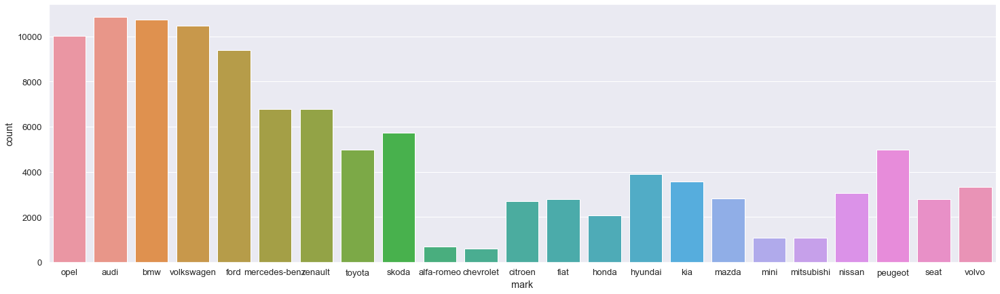

In [70]:
plt.figure(figsize=(25,7))
sns.countplot(df['mark'])

<AxesSubplot:xlabel='fuel', ylabel='count'>

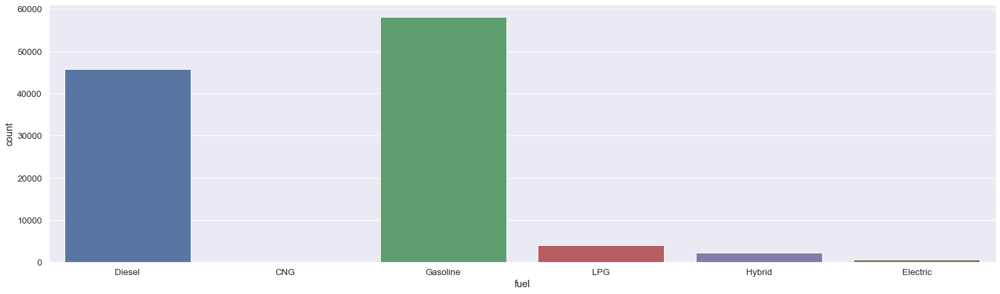

In [71]:
plt.figure(figsize=(25,7))
sns.countplot(df['fuel'])

<AxesSubplot:xlabel='vol_engine', ylabel='price'>

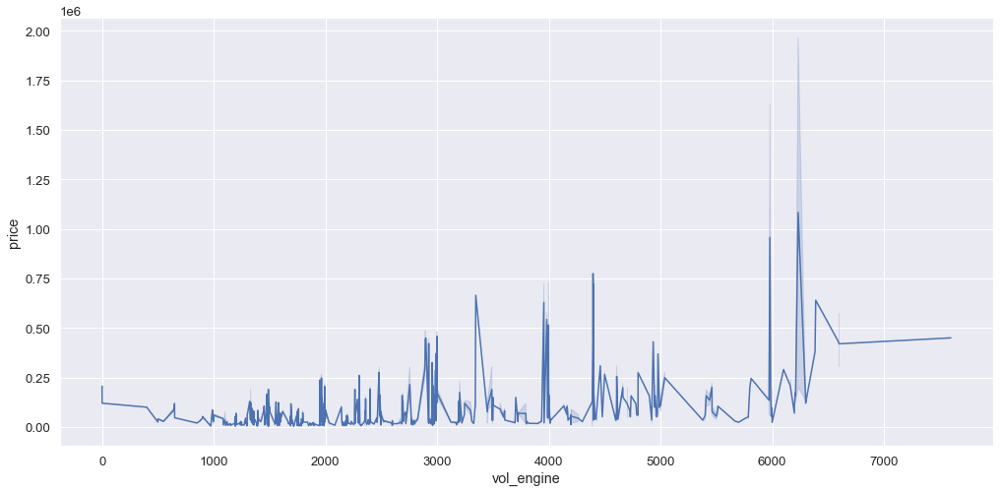

In [72]:
plt.figure(figsize=(17,8))
sns.lineplot(data=df,x="vol_engine",y="price", palette='Set2')

In [73]:
px.scatter(df,x="year",y="price",animation_frame="mark",color="fuel", hover_name='model')

In [74]:
corr_1 = df.groupby('mark')['price'].mean().sort_values()
corr_1

mark
citroen           33999.633850
opel              36367.216597
fiat              38196.479986
seat              39505.400787
chevrolet         40359.453795
renault           44726.374577
peugeot           46305.361976
honda             47623.768671
mitsubishi        48950.999071
nissan            49266.230416
ford              50741.506560
hyundai           53521.120143
toyota            53973.644494
mazda             56388.569801
kia               58181.175942
skoda             61279.840091
volkswagen        61870.866546
alfa-romeo        65794.752187
mini              71536.833643
volvo             92472.250599
audi             105392.749011
bmw              121183.286793
mercedes-benz    135598.585963
Name: price, dtype: float64

<AxesSubplot:xlabel='mark'>

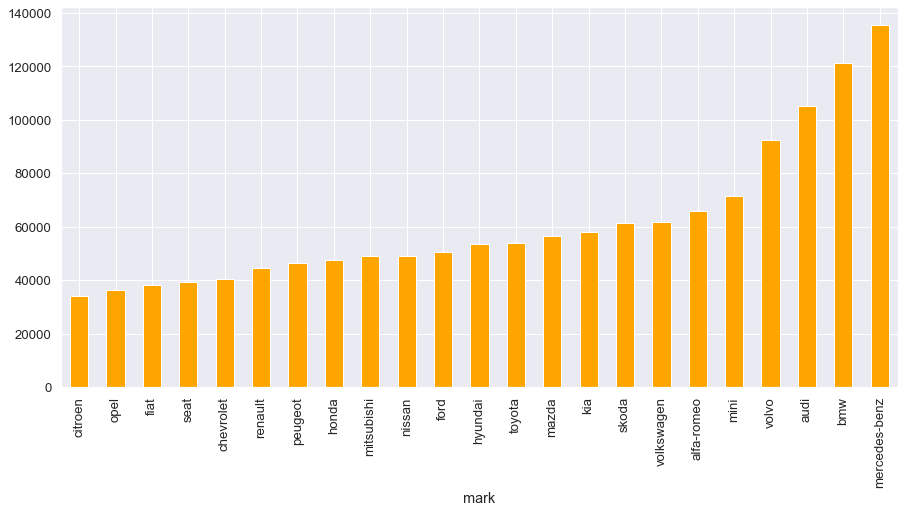

In [75]:
plt.figure(figsize=(15,7))
corr_1.plot(kind='bar', color='orange')

In [76]:
corr_2 = df.groupby('fuel')['price'].mean().sort_values()
corr_2

fuel
LPG          27307.425921
CNG          30796.476190
Gasoline     65157.168699
Diesel       70620.197740
Hybrid      159289.210872
Electric    191076.428951
Name: price, dtype: float64

<AxesSubplot:xlabel='fuel'>

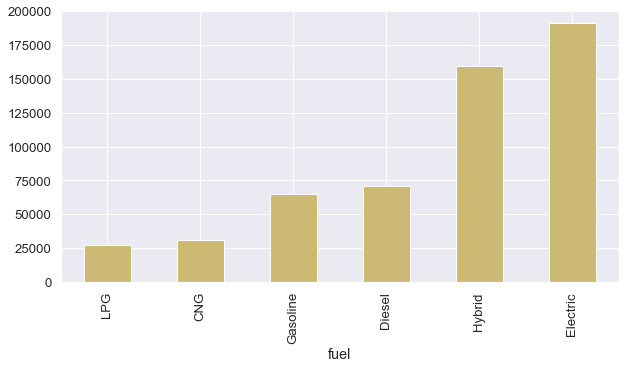

In [77]:
plt.figure(figsize=(10,5))
corr_2.plot(kind='bar', color='y')

In [78]:
df.describe().round(2)

,year,mileage,vol_engine,price
count,111166.00,111166.00,111166.00,111166.00
mean,2012.88,141818.03,1810.24,68786.77
std,5.65,91686.86,641.28,83126.11
min,1945.00,0.00,0.00,500.00
25%,2009.00,69376.25,1461.00,21200.00
50%,2013.00,147000.00,1781.00,41500.00
75%,2017.00,203000.00,1995.00,80900.00
max,2022.00,2800000.00,7600.00,2399900.00


<AxesSubplot:xlabel='mileage'>

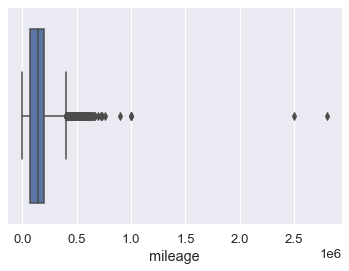

In [79]:
sns.boxplot(df['mileage'])

In [80]:
df[df['mileage'] > 300000]

,mark,model,year,mileage,vol_engine,fuel,city,province,price
65,opel,vectra,1999,310000,1799,Gasoline,Góra Kalwaria,Mazowieckie,2600
66,opel,vectra,2001,345000,1796,Gasoline,Maków Mazowiecki,Mazowieckie,6000
69,opel,vectra,1998,401315,1998,LPG,Mogilno,Kujawsko-pomorskie,2000
77,opel,vectra,1998,303000,1998,LPG,Ostrów Wielkopolski,Wielkopolskie,2350
81,opel,vectra,1999,326492,1799,LPG,Jelcz-Laskowice,Dolnośląskie,4500
...,...,...,...,...,...,...,...,...,...
117001,volvo,xc-90,2005,320181,2401,Diesel,Lublin,Lubelskie,29500
117005,volvo,xc-90,2005,429000,2401,Diesel,Gorzów Wielkopolski,Lubuskie,25900
117009,volvo,xc-90,2005,320560,2401,Diesel,Gorzów Wielkopolski,Lubuskie,31500
117023,volvo,xc-90,2005,307000,2401,Diesel,Kraków,Małopolskie,18900


In [81]:
df1 = df.copy()

In [82]:
df1[df1['mileage'] > 500000]

,mark,model,year,mileage,vol_engine,fuel,city,province,price
7280,opel,vectra,2008,631970,1910,Diesel,Paniówki,Śląskie,11990
7485,opel,vivaro,2006,568245,1995,Diesel,Gorzów Wielkopolski,Lubuskie,15900
7546,opel,vivaro,2016,650000,1598,Diesel,Świnoujście,Zachodniopomorskie,59500
11594,opel,vivaro,2016,650000,1598,Diesel,Świnoujście,Zachodniopomorskie,59000
11606,opel,vivaro,2017,692800,1598,Diesel,Ruda Śląska,Śląskie,39900
...,...,...,...,...,...,...,...,...,...
90422,hyundai,i30,2013,542000,1582,Diesel,Sulechów,Lubuskie,21900
103793,nissan,patrol,2005,634485,2953,Diesel,Łomianki,Mazowieckie,75000
109662,peugeot,3008,2010,527000,1560,Diesel,Olsztyn,Warmińsko-mazurskie,24354
114507,volvo,s80,2005,508000,2401,Diesel,Szustek,Kujawsko-pomorskie,7999


<AxesSubplot:xlabel='mileage'>

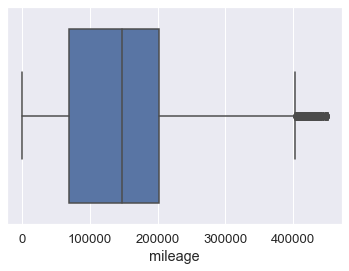

In [83]:
df1 = df1[df1['mileage'] <= 450000]
sns.boxplot(df1['mileage'])

In [84]:
df2 = df1.copy()

<AxesSubplot:xlabel='vol_engine'>

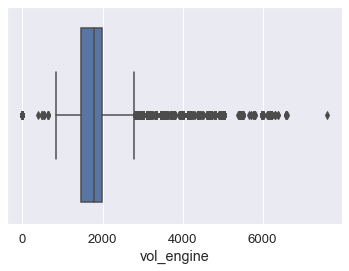

In [85]:
sns.boxplot(df2['vol_engine'])

In [86]:
df2[df2['vol_engine']<100]

,mark,model,year,mileage,vol_engine,fuel,city,province,price
370,opel,ampera,2019,23304,0,Electric,Gdańsk,Pomorskie,149900
3202,opel,astra,2021,0,0,Diesel,Katowice,Śląskie,91600
3248,opel,astra,2021,0,0,Diesel,Katowice,Śląskie,100000
5393,opel,corsa,2020,5000,0,Electric,Chorzów,Śląskie,119900
5414,opel,corsa,2021,5,0,Electric,Łódź,Łódzkie,105900
...,...,...,...,...,...,...,...,...,...
115956,volvo,xc-40,2021,5,0,Electric,Gdynia,Pomorskie,252900
115967,volvo,xc-40,2022,1,0,Electric,Katowice,Śląskie,220600
115990,volvo,xc-40,2021,4300,0,Electric,Tychy,Śląskie,284900
115995,volvo,xc-40,2021,1,0,Electric,Chorzów,Śląskie,210100


In [87]:
df2 = df2[df2['vol_engine']>=660]

<AxesSubplot:xlabel='vol_engine'>

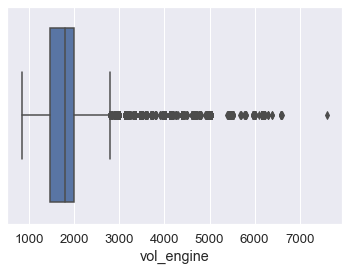

In [88]:
sns.boxplot(df2['vol_engine'])

In [89]:
df2[df2['vol_engine']>4000]

,mark,model,year,mileage,vol_engine,fuel,city,province,price
18094,audi,a6,2001,254000,4172,Gasoline,Grodzisk Wielkopolski,Wielkopolskie,13500
18111,audi,a6,1999,249000,4172,Gasoline,Sochaczew,Mazowieckie,21900
18124,audi,a6,2001,273000,4172,Gasoline,Radwanice,Dolnośląskie,24900
18140,audi,a6,1999,166000,4172,Gasoline,Chroberz,Świętokrzyskie,11500
18149,audi,a6,1999,310000,4163,LPG,Szczecinek,Zachodniopomorskie,18900
...,...,...,...,...,...,...,...,...,...
116989,volvo,xc-90,2007,231000,4414,LPG,Kolonia Gościeńczyce,Mazowieckie,34900
116993,volvo,xc-90,2005,329000,4414,Gasoline,Jawiszowice,Małopolskie,29900
116995,volvo,xc-90,2009,207000,4414,Gasoline,Olsztyn,Warmińsko-mazurskie,53900
117011,volvo,xc-90,2005,280000,4414,Gasoline,Pionki,Mazowieckie,32800


In [90]:
df2 =  df2[df2['vol_engine']<=4000]

<AxesSubplot:xlabel='vol_engine'>

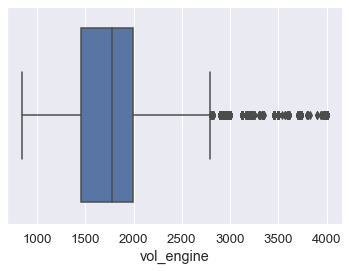

In [91]:
sns.boxplot(df2['vol_engine'])

In [92]:
df3 = df2.copy()

In [93]:
df3[df3['price']>400000]

,mark,model,year,mileage,vol_engine,fuel,city,province,price
5032,opel,corsa,2013,105703,1398,Gasoline,Wilchta,Mazowieckie,999999
16148,audi,a4,2012,213400,1968,Diesel,Zwoleń,Mazowieckie,449000
19935,audi,a6,2021,1,2967,Diesel,Kraków,Małopolskie,402200
20030,audi,a6,2021,5000,2995,Gasoline,Gdańsk,Pomorskie,489900
20062,audi,a6,2021,1,2967,Diesel,Chorzów,Śląskie,402200
...,...,...,...,...,...,...,...,...,...
117045,volvo,xc-90,2021,1,1969,Hybrid,Chorzów,Śląskie,400400
117046,volvo,xc-90,2022,1,1969,Hybrid,Chorzów,Śląskie,405300
117071,volvo,xc-90,2021,5,1969,Hybrid,Gdańsk,Pomorskie,429900
117220,volvo,xc-90,2021,1,1969,Hybrid,Kraków,Małopolskie,417200


<AxesSubplot:xlabel='price'>

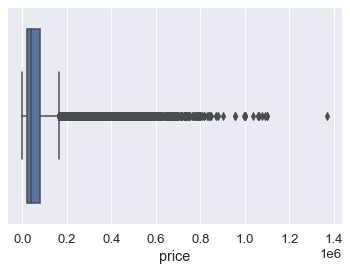

In [94]:
sns.boxplot(df2['price'])

In [95]:
df3 = df3[df3['price']<=400000]
df3

,mark,model,year,mileage,vol_engine,fuel,city,province,price
0,opel,combo,2015,139568,1248,Diesel,Janki,Mazowieckie,35900
1,opel,combo,2018,31991,1499,Diesel,Katowice,Śląskie,78501
2,opel,combo,2015,278437,1598,Diesel,Brzeg,Opolskie,27000
3,opel,combo,2016,47600,1248,Diesel,Korfantów,Opolskie,30800
4,opel,combo,2014,103000,1400,CNG,Tarnowskie Góry,Śląskie,35900
...,...,...,...,...,...,...,...,...,...
117250,volvo,xc-90,2017,51000,1969,Diesel,Chechło Pierwsze,Łódzkie,229900
117251,volvo,xc-90,2016,83500,1969,Gasoline,Pruszcz Gdański,Pomorskie,135000
117252,volvo,xc-90,2017,174000,1969,Diesel,Kalisz,Wielkopolskie,154500
117253,volvo,xc-90,2016,189020,1969,Gasoline,Sionna,Mazowieckie,130000


<AxesSubplot:xlabel='price'>

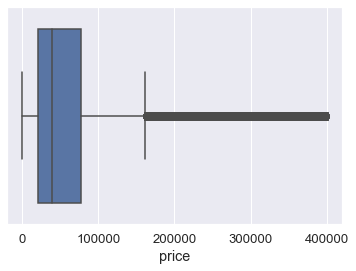

In [96]:
sns.boxplot(df3['price'])

In [97]:
df3.describe()

,year,mileage,vol_engine,price
count,107240.000000,107240.000000,107240.000000,107240.000000
mean,2012.803777,143698.584316,1768.104588,61631.825093
std,5.501672,88571.322580,469.544265,62736.164102
min,1952.000000,1.000000,850.000000,500.000000
25%,2009.000000,74492.250000,1461.000000,20900.000000
50%,2013.000000,149593.500000,1749.000000,39900.000000
75%,2017.000000,204000.000000,1995.000000,76990.000000
max,2022.000000,450000.000000,4000.000000,400000.000000


In [98]:
df3.shape

(107240, 9)

In [99]:
df.isnull().values.any()

False

In [100]:
df.duplicated().values.any()

False

In [101]:
df3.head()

,mark,model,year,mileage,vol_engine,fuel,city,province,price
0,opel,combo,2015,139568,1248,Diesel,Janki,Mazowieckie,35900
1,opel,combo,2018,31991,1499,Diesel,Katowice,Śląskie,78501
2,opel,combo,2015,278437,1598,Diesel,Brzeg,Opolskie,27000
3,opel,combo,2016,47600,1248,Diesel,Korfantów,Opolskie,30800
4,opel,combo,2014,103000,1400,CNG,Tarnowskie Góry,Śląskie,35900


In [102]:
le = LabelEncoder()
for col in df3[['mark', 'fuel']]:
    df3[col] = le.fit_transform(df3[col])

In [103]:
df3.drop(columns=['model','city','province'], inplace=True)

In [104]:
df3.head()

,mark,year,mileage,vol_engine,fuel,price
0,15,2015,139568,1248,1,35900
1,15,2018,31991,1499,1,78501
2,15,2015,278437,1598,1,27000
3,15,2016,47600,1248,1,30800
4,15,2014,103000,1400,0,35900


In [105]:
df3.shape

(107240, 6)

In [106]:
x = df3.drop('price', axis=1) 
y = df3['price']

In [107]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [108]:
scaler = StandardScaler()
scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

In [109]:
models = {
    "LR": LinearRegression(),
    "DT": DecisionTreeRegressor(),
    "RF": RandomForestRegressor(),
    "XGBR": XGBRegressor(),
    "KNNR" : KNeighborsRegressor()}

In [110]:
for name, model in models.items():
    print('-'*30)
    print(f'Using model: {name}')
    
    model.fit(x_train, y_train)
    print(f'Training Score: {model.score(x_train, y_train)}')
    
    y_pred = model.predict(x_test)
    print(f'Test Score: {r2_score(y_test, y_pred)}')  

------------------------------
Using model: LR
Training Score: 0.6695792163534198
Test Score: 0.6701990986751201
------------------------------
Using model: DT
Training Score: 0.980762733873255
Test Score: 0.8578137133703715
------------------------------
Using model: RF
Training Score: 0.9702197406264211
Test Score: 0.8965062196906858
------------------------------
Using model: XGBR
Training Score: 0.9276954406324834
Test Score: 0.9080883504031748
------------------------------
Using model: KNNR
Training Score: 0.9286458956369705
Test Score: 0.8949668131894737


## Randomforest hase is the higher model with accuracy 90%